# Comparison of sea ice concentration products to ice charts

## User question
How do the Arctic and Antarctic sea ice extent from the EUMETSAT-OSISAF ICDR sea ice concentration (SIC) product compare to manual ice charts from the United States National Ice Center (NIC)?

## Methods
From the [sea ice concentration dataset](https://cds.climate.copernicus.eu/cdsapp#!/dataset/satellite-sea-ice-concentration?tab=overview), we use the EUMETSAT OSI SAF ICDR product, which covers the years 2016 to 2023.

NIC ice charts can be downloaded as shapefiles from [https://usicecenter.gov/](https://usicecenter.gov/) and then rasterized onto the EUMETSAT OSI SAF Arctic or Antarctic grids and saved as daily netCDF files with paths depending on the date according to `nh/%Y/nic_miz_%Y%m%d_nc_pl_a.nc` for the northern hemisphere, and `sh/%Y/nic_miz_%Y%m%d_sc_pl_a.nc` for the southern hemisphere. These paths are relatively to a user-defined directory `NIC_ICE_CHARTS_PATH` set below in the `Set parameters` section. The netCDF files can be obtained from the author at the email [timothy.williams@nersc.no](mailto:timothy.williams@nersc.no), otherwise users can do their own rasterizing. There is bash code in the "Code" section which shows how to download shapefiles for a given date.

Having obtained the two datasets on the same grid, we can compare them pixel by pixel. The NIC ice charts have 3 categories:
1. $0\% \leq {\rm SIC} \leq 10\%$
2. $10\% < {\rm SIC} \leq 80\%$
3. $80\% <{\rm SIC} \leq 100\%$

We reduced the number of categories from 3 to 2 (open water or ice-covered) by merging categories 2 and 3. The EUMETSAT OSI SAF SIC product was also converted to open water or ice-covered categories by using a threshold of SIC > 10%.

We then computed two areas $A_\pm$, where $A_+$ is the total area where the ICDR has ice and NIC has no ice, and $A_-$ is the total area where the ICDR has no ice and NIC has ice. A "bias" is then defined as $A_+ - A_-$ and an an IIEE (integrated ice edge error, or the total area where the classification from the SIC product disagrees with the ice chart classification) is defined as $A_+ + A_-$.
Time series of these metrics were then plotted.

To give an idea of the spatial distribution of the differences, for each pixel and month a probability of being ice-covered was calculated for the ICDR and the NIC. The difference between these monthly probabilities was then calculated and plotted as maps.

## Summary
The EUMETSAT OSI SAF ICDR SIC from passive microwave was compared to the NIC daily MIZ ice charts for both the Arctic and Antarctic. The differences were the largest in summer when the SIC from passive microwave has the largest errors due to melt ponds for example. The maximum IIEE reached $2\times10^6$km$^2$ in the Arctic and $4\times10^6$km$^2$ in the Antarctic. While we would expect the ice charts, which are created manually, to be more reliable, this is not guaranteed. Hence further checking of which is indeed the most reliable should be done. However, the large disagreements highlight the potential uncertainty in the ICDR.

## Code

### Download NIC shapefiles

#### Arctic

Arctic MIZ shapefiles were downloaded from [here](https://usicecenter.gov/Products/ArchiveSearch?table=DailyArctic&product=Arctic%20MIZ%20Chart&linkChange=arc-one). They are available from 11 February 2016 to present. An Arctic shapefile for a given date can be downloaded and extracted with a bash script like:

```
shapefile_date=20160211
product_number=5
zipfile=DownloadArchive?prd=${product_number}$(date -d "$shapefile_date" "+%m%d%Y")
wget https://usicecenter.gov/File/$zipfile
unzip $zipfile
```

`ls $(date -d $shapefile_date" "+nic_miz%Y%jnc_pl_a")*` gives the following files:
```
nic_miz2016042nc_pl_a.dbf
nic_miz2016042nc_pl_a.prj
nic_miz2016042nc_pl_a.shp
nic_miz2016042nc_pl_a.shp.xml
nic_miz2016042nc_pl_a.shx
```

#### Antarctic
Antarctic MIZ shapefiles were downloaded from [here](https://usicecenter.gov/Products/ArchiveSearch?table=DailyAntarctic&product=Antarctic%20MIZ%20Chart&linkChange=ant-one). They are available from 11 February 2016 to present. An Antarctic shapefile for a given date can be downloaded and extracted with a bash script like:
```
shapefile_date=20160211
product_number=19
zipfile=DownloadArchive?prd=${product_number}$(date -d "$shapefile_date" "+%m%d%Y")
wget https://usicecenter.gov/File/$zipfile
unzip $zipfile
```

`ls $(date -d $shapefile_date" "+nic_miz%Y%jsc_pl_a")*` gives the following files:
```
nic_miz2016042sc_pl_a.dbf
nic_miz2016042sc_pl_a.prj
nic_miz2016042sc_pl_a.shp
nic_miz2016042sc_pl_a.shp.xml
nic_miz2016042sc_pl_a.shx
```

### Import libraries

In [1]:
import warnings

import os
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import xarray as xr
from c3s_eqc_automatic_quality_control import diagnostics, download, plot
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import calendar
from cmocean import cm
import cartopy.crs as ccrs

plt.style.use("seaborn-v0_8-notebook")
warnings.filterwarnings("ignore", module="cf_xarray")

### Set parameters

In [2]:
# Time
start_year = 2016
stop_year = 2022
map_years = list(range(2016, 2023))

# Path to NIC ice charts
NIC_ICE_CHARTS_PATH = "/data/wp5/williams_timothy/nic_ice_charts"

### Define request

In [3]:
# allowed time range determined by availability of NIC ice charts
year_min = 2016
year_max = 2023
for map_year in map_years:
    assert(map_year >= year_min and map_year <= year_max)

collection_id = 'satellite-sea-ice-concentration'
common_request = {
    "origin": "EUMETSAT OSI SAF",
    "sensor": "ssmis",
    "temporal_aggregation": "daily",
    "cdr_type": "icdr",
    "variable": "all",
    "version": "v2",
}

# requests for calculating time series of differences between ICDR and NIC
requests_time_series = download.update_request_date(
    common_request,
    start=f"{max(start_year, year_min)}-01",
    stop=f"{min(stop_year, year_max)}-12",
    stringify_dates=True,
)

### Functions used in caching of both time series and map data

In [4]:
def get_nic_data(time, region):
    files = []
    for t in time:
        f = pd.Timestamp(t.item()).strftime(f"{NIC_ICE_CHARTS_PATH}/{region}/%Y/nic_miz_%Y%m%d_{region[0]}c_pl_a.nc")
        if os.path.exists(f):
            files += [f]
    if len(files) == 0:
        return
    return xr.open_mfdataset(files)


def get_black_adriatic(da):
    # get Black and Adriatic Seas for masking
    return (da["longitude"] > 0.) * (da["longitude"] < 60.) * (da["latitude"] <= 48.) * (da["latitude"] > 0.)

### Functions to cache time series

In [5]:
def compare_siconc_vs_nic(ds, ds_nic):
    ds = ds.convert_calendar("standard", align_on="date")

    # grid cell area of sea ice edge grid
    dims = ("xc", "yc")
    dx = np.diff(ds[dims[0]][:2].values)[0]
    grid_cell_area = (dx ** 2) * 1.0e-6  # 10^6 km2

    # get sea ice concentration and convert to ice/water classification
    lonlat = {v: ds[v][:] for v in ["longitude", "latitude"]}
    sic = ds.cf["sea_ice_area_fraction"].assign_coords(lonlat)
    if sic.attrs.get("units", "") == "(0 - 1)":
        sic *= 100
    sic_threshold = 10
    sic_class = xr.where(sic >= sic_threshold, 2, 1).assign_coords(sic.coords) # 1 = open water, 2 = ice
    sic_class = xr.where(get_black_adriatic(sic), 1, sic_class) # set to open water since NIC never has ice there
    proj_var = sic.grid_mapping
    data_arrays = {}

    # extent from SIC
    data_arrays["extent_cds"] = grid_cell_area * (sic_class - 1).sum(dim=dims)
    data_arrays["extent_cds"].attrs = {
        "standard_name": "sea_ice_extent_from_cds",
        "units": "$10^6$km$^2$",
        "long_name": "Sea ice extent from CDS",
    }
    
    # get NIC classification and compare to the one from SIC
    # - 1 = open water, 2 = miz, 3 = pack
    nic_class = xr.DataArray(ds_nic.cf["sea_ice_classification"], dims=sic.dims, coords=sic.coords)
    nic_ice_mask = (nic_class >= 2)
    
    # extent from NIC
    data_arrays["extent_nic"] = grid_cell_area * nic_ice_mask.sum(dim=dims)
    data_arrays["extent_nic"].attrs = {
        "standard_name": "sea_ice_extent_from_nic",
        "units": "$10^6$km$^2$",
        "long_name": "Sea ice extent from NIC",
    }
    
    # compare the 2 products
    over = (sic_class == 2) * (nic_class == 1)
    under = (sic_class == 1) * nic_ice_mask
    over = grid_cell_area * over.sum(dim=dims)
    under = grid_cell_area * under.sum(dim=dims)

    # add IIEE metric to output
    data_arrays["iiee"] = over + under
    data_arrays["iiee"].attrs = {
        "standard_name": "integrated_ice_edge_error",
        "units": "$10^6$km$^2$",
        "long_name": "Integrated ice edge error",
    }

    # add bias metric to output
    data_arrays["siextent_bias"] = over - under
    data_arrays["siextent_bias"].attrs = {
        "standard_name": "sea_ice_extent_bias",
        "units": "$10^6$km$^2$",
        "long_name": "Sea ice extent bias",
    }
    return xr.Dataset(data_arrays)


def compute_siconc_nic_time_series(ds, region):
    # load NIC data
    ds_nic = get_nic_data(ds["time"], region=region)

    # select the common times
    ds, ds_nic = xr.align(ds, ds_nic, join='inner')
    
    # Compare the sea ice concentration product with the sea ice edge classification
    return compare_siconc_vs_nic(ds, ds_nic)

### Define functions to cache map data

In [6]:
def get_probabilities(da, sic, **kwargs):
    da = xr.DataArray(
        100 * da.groupby("time.month").mean(dim="time"),
        **kwargs)
    da = xr.where(np.isfinite(sic), da, np.nan)
    da = xr.DataArray(
        da, **kwargs,
        attrs = {
            "standard_name": "probability_ice_covered", 
            "units": "%",
            "long_name": "Probability of cell being ice-covered",
            "grid_mapping": "Lambert_Azimuthal_Grid",
        },
    )
    return da


def postproc_probabilities(da, coords, product):
    p = da.assign_coords(coords)
    p = xr.where(get_black_adriatic(p), np.nan, p)
    return xr.Dataset({"probability_ice_covered": p.assign_coords(coords)}).expand_dims(product=[product])


def get_monthly_probabilities(ds, region):
    # load NIC data and calculate the monthly climatology
    ds_nic = get_nic_data(ds["time"], region=region)

    # get common times
    ds, ds_nic = xr.align(ds.drop_dims("nv"), ds_nic, join="inner")
    proj_name = "Lambert_Azimuthal_Grid"
    attrs = {v : ds[v].attrs for v in ["longitude", "latitude", proj_name]}

    # get climatologies
    sic = ds.cf["sea_ice_area_fraction"]
    ice_mask = xr.where(sic > 10, 1., 0.)
    sic = sic.groupby('time.month').mean(dim="time")
    kw = {"sic": sic, "dims": sic.dims,  "coords": sic.coords.copy()}

    # combine data arrays into one dataset
    coords = {v: (ds[v].dims, ds[v].values, ds[v].attrs)
              for v in ["longitude", "latitude"]}
    datasets = [
        postproc_probabilities(get_probabilities(ice_mask, **kw), coords, "ICDR"),
        postproc_probabilities(get_probabilities(xr.where(ds_nic["ice_code"] >= 2, 1., 0.), **kw), coords, "NIC"),
    ]
    ds = xr.concat(datasets, "product").compute()
    ds[proj_name] = xr.DataArray().astype(np.byte)
    for v, a in attrs.items():
        ds[v].attrs = a
    return ds

### Functions for plotting time series

In [7]:
def rearrange_year_vs_dayofyear(ds):
    new_dims = ("year", "dayofyear")
    ds = ds.convert_calendar("noleap")
    ds = ds.assign_coords(
        {dim: ("time", getattr(ds["time"].dt, dim).values) for dim in new_dims}
    )
    return ds.set_index(time=new_dims).unstack("time")


def make_subplot(ax, ds_doy, vname, color_map):
    num_years = len(ds_doy.year)
    for i,year in enumerate(ds_doy.year):
        da = ds_doy.sel(year=year)[vname].squeeze()
        ax.plot(da.dayofyear, da.values, color=color_map(i/(num_years-1)), label=year.item())
        # ax.plot(da.dayofyear, da.values, label=year.item())


def plot_time_series_doy(ds, cmap="viridis"):
    ds_doy = rearrange_year_vs_dayofyear(ds)
    num_years = len(ds_doy.year)
    color_map = plt.get_cmap(cmap, num_years)
    fig, axs = plt.subplots(4, 1, sharex=True, figsize=(14,12))

    i = 0
    ax = axs[i]
    make_subplot(ax, ds_doy, "extent_cds", color_map)
    ax.set_ylabel(f"ICDR extent [10$^6$km$^2$]")
    ax.legend(ncol=2)

    i += 1
    ax = axs[i]
    make_subplot(ax, ds_doy, "extent_nic", color_map)
    ax.set_ylabel(f"NIC extent [10$^6$km$^2$]")
    ax.legend(ncol=2)


    i += 1
    ax = axs[i]
    make_subplot(ax, ds_doy, "siextent_bias", color_map)
    xlim = list(ax.get_xlim())
    ax.plot(xlim, [0,0], ":k", zorder=0)
    ax.set_ylabel(f"Bias [10$^6$km$^2$]")
    ax.set_xlim(xlim)
    ax.legend(ncol=2)

    i += 1
    ax = axs[i]
    make_subplot(ax, ds_doy, "iiee", color_map)
    ax.set_ylabel(f"IIEE [10$^6$km$^2$]")
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%d %b"))
    ax.xaxis.set_tick_params(rotation=45)
    ax.legend(ncol=2)
    return

### Code for plotting maps

In [8]:
def get_data_array_for_plotting(ds, year=None):
    # zoom in on ice
    isel_dict = {'xc': slice(50, -50), 'yc': slice(50, -50)}
    da = ds.probability_ice_covered.isel(isel_dict)

    # select a particular year and remove months without data
    if year is not None:
        sel_dict = {'year': year}
        if year == 2016:
            sel_dict['month'] = list(range(2, 13))
        elif year == 2023:
            sel_dict['month'] = list(range(1, 5))
        da = da.sel(sel_dict).squeeze()

    # rename month dimension from integer to short names
    da["month"] = [calendar.month_abbr[i] for i in da.month.values]
    return da


def make_plot(da, region, **kwargs):
    clat = 90. if region == "northern_hemisphere" else -90.
    plot.projected_map(da, **kwargs,
        projection=ccrs.LambertAzimuthalEqualArea(central_latitude=clat))


def plot_maps(datasets_maps, region, year):
    da = get_data_array_for_plotting(datasets_maps[region], year)
    make_plot(da, region, col="product", row="month", cmap=cm.ice)


def plot_bias_maps(datasets_maps, region, year=None):
    da = get_data_array_for_plotting(datasets_maps[region], year)
    bias = (da.sel(product="ICDR").squeeze() - da.sel(product="NIC").squeeze())
    bias.attrs["long_name"] = "Bias in ICDR compared to NIC ice charts"
    col = "year" if year is None else None
    make_plot(bias, region, row="month", col=col, cmap=cm.balance, vmin=-50, vmax=50)

### Download and transform

In [9]:
download_kwargs = {
    "drop_variables": (
        "raw_ice_conc_values",
        "total_standard_error",
        "smearing_standard_error",
        "algorithm_standard_error",
        "status_flag",
    ),
}

In [10]:
datasets = []
for region in [
    "northern_hemisphere",
    "southern_hemisphere",
]:
    requests = [request | {"region": region} for request in requests_time_series]
    print(requests)
    ds = download.download_and_transform(
        collection_id, requests,
        transform_func=compute_siconc_nic_time_series,
        transform_func_kwargs={"region": region},
        chunks={"year": 1},
        **download_kwargs,
    )
    datasets.append(ds.expand_dims(region=[region]).compute())
dataset_compare_nic = xr.concat(datasets, "region")
del(datasets)

[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'year': ['2016', '2017', '2018', '2019', '2020', '2021', '2022'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31'], 'region': 'northern_hemisphere'}]


100%|██████████| 7/7 [00:01<00:00,  6.21it/s]


[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'year': ['2016', '2017', '2018', '2019', '2020', '2021', '2022'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31'], 'region': 'southern_hemisphere'}]


100%|██████████| 7/7 [00:00<00:00, 15.36it/s]


In [11]:
datasets_maps = {}
datasets = []
for region in [
    "northern_hemisphere",
    "southern_hemisphere",
]:
    for map_year in map_years:
        requests_maps = download.update_request_date(
            common_request | {"region": region},
            start=f"{map_year}-01",
            stop=f"{map_year}-12",
            stringify_dates=True,
        )
        print(requests_maps)
        datasets += [download.download_and_transform(
            collection_id, requests_maps,
            transform_func=get_monthly_probabilities,
            transform_func_kwargs={"region": region},
            **download_kwargs,
        ).expand_dims(year=[int(map_year)])]
    datasets_maps[region] = xr.concat(datasets, "year").compute()
    datasets = []

[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'region': 'northern_hemisphere', 'year': ['2016'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']}]


100%|██████████| 1/1 [00:00<00:00,  7.17it/s]


[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'region': 'northern_hemisphere', 'year': ['2017'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']}]


100%|██████████| 1/1 [00:00<00:00,  9.70it/s]


[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'region': 'northern_hemisphere', 'year': ['2018'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']}]


100%|██████████| 1/1 [00:00<00:00,  9.52it/s]


[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'region': 'northern_hemisphere', 'year': ['2019'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']}]


100%|██████████| 1/1 [00:00<00:00,  9.73it/s]


[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'region': 'northern_hemisphere', 'year': ['2020'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']}]


100%|██████████| 1/1 [00:00<00:00,  7.53it/s]


[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'region': 'northern_hemisphere', 'year': ['2021'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']}]


100%|██████████| 1/1 [00:00<00:00,  6.47it/s]


[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'region': 'northern_hemisphere', 'year': ['2022'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']}]


100%|██████████| 1/1 [00:00<00:00, 12.57it/s]


[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'region': 'southern_hemisphere', 'year': ['2016'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']}]


100%|██████████| 1/1 [00:00<00:00, 21.71it/s]


[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'region': 'southern_hemisphere', 'year': ['2017'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']}]


100%|██████████| 1/1 [00:00<00:00,  4.29it/s]


[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'region': 'southern_hemisphere', 'year': ['2018'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']}]


100%|██████████| 1/1 [00:00<00:00, 22.79it/s]


[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'region': 'southern_hemisphere', 'year': ['2019'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']}]


100%|██████████| 1/1 [00:00<00:00, 23.66it/s]


[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'region': 'southern_hemisphere', 'year': ['2020'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']}]


100%|██████████| 1/1 [00:00<00:00, 18.59it/s]


[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'region': 'southern_hemisphere', 'year': ['2021'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']}]


100%|██████████| 1/1 [00:00<00:00, 23.29it/s]


[{'origin': 'EUMETSAT OSI SAF', 'sensor': 'ssmis', 'temporal_aggregation': 'daily', 'cdr_type': 'icdr', 'variable': 'all', 'version': 'v2', 'region': 'southern_hemisphere', 'year': ['2022'], 'month': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'day': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']}]


100%|██████████| 1/1 [00:00<00:00, 23.58it/s]


## Results

### Northern hemisphere
Below we plot comparisons between the Arctic sea ice extents in the EUMETSAT OSI SAF concentration datasets and the NIC ice charts. The upper two plots show they have fairly similar intra- and inter-annual variability, although there is more variability at shorter time scales in the NIC extent. The bias (ICDR - NIC) plot shows that ICDR has consistently less ice than NIC, with the possible exception of September. The bias is largest in the summer months when the passive microwave concentration would be expected to have the greatest errors, at times exceeding $10^6$km$^2$. The IIEE is also quite high, ranging between 1 and 2.5 $\times10^6$km$^2$, with the maximum again in summer. The year with the greatest IIEE is 2018, while 2018 (May - June), 2021 (July - August) and 2019 (August - September)  have the lowest values of IIEE.

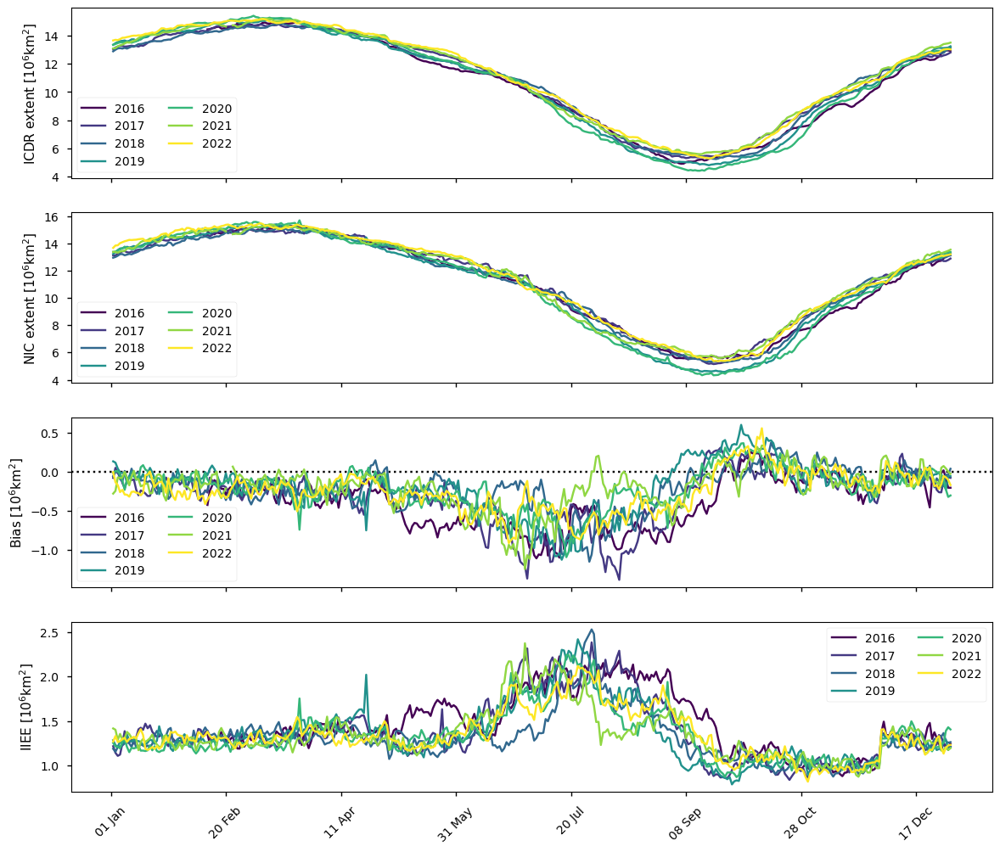

In [12]:
plot_time_series_doy(dataset_compare_nic.sel(region="northern_hemisphere"))

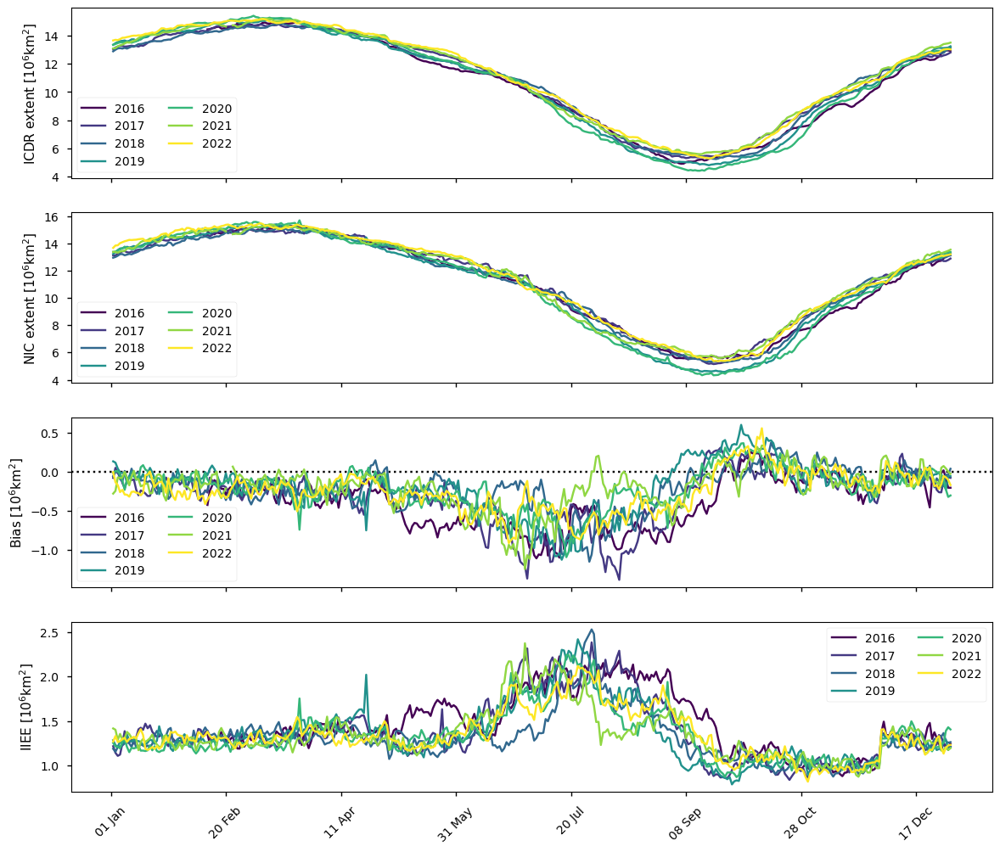

In [13]:
plot_time_series_doy(dataset_compare_nic.sel(region="northern_hemisphere"))

The regions where there is disagreement - mostly ice in the ice charts, but not in the ICDR - at the ice edge, which varies in location according to the time of year. In the winter months this is in the Labrador, Greenland and Barents Sea on the Atlantic side, and the Bering and Okhotsk Seas on the Pacific side. In the summer months there are also areas of disagreement off the Arctic and Siberian coasts and in the Hudson Bay. These areas are larger, possibly due to errors in the SIC from passive microwave, and maybe also due to the ice edge being in more dynamic areas such as the Beaufort Sea.

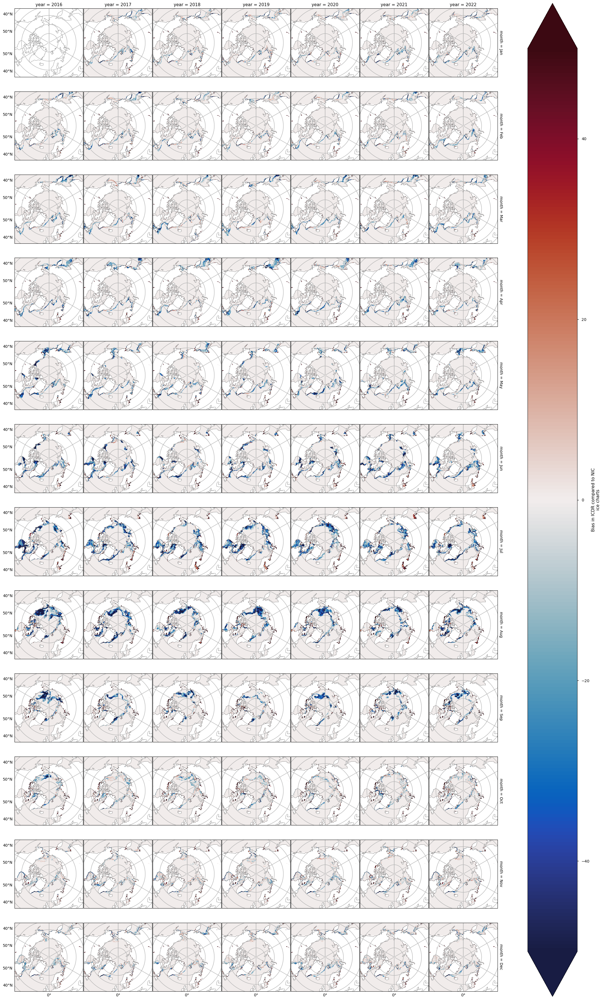

In [14]:
plot_bias_maps(datasets_maps, "northern_hemisphere")

### Southern hemisphere
Below we plot comparisons between the Antarctic sea ice extents in the EUMETSAT OSI SAF concentration datasets and the NIC ice charts. As with the Arctic time series, the upper two plots show they have fairly similar intra- and inter-annual variability, and there is again more variability at shorter time scales in the NIC extent. However, this variability has a higher amplitude than for the Arctic. The bias plot shows that ICDR nearly always has less ice than NIC. The bias is largest in the summer months when the passive microwave concentration would be expected to have the greatest errors, at times exceeding $3 \times 10^6$km$^2$. The IIEE is only slightly higher, reflecting the fact that there are few areas where ICDR has ice when NIC does not. It ranges between 1 and 2 $\times10^6$km$^2$ in winter, and between 2 and 4 $\times10^6$km$^2$ in summer. The year with the greatest IIEE is 2016.

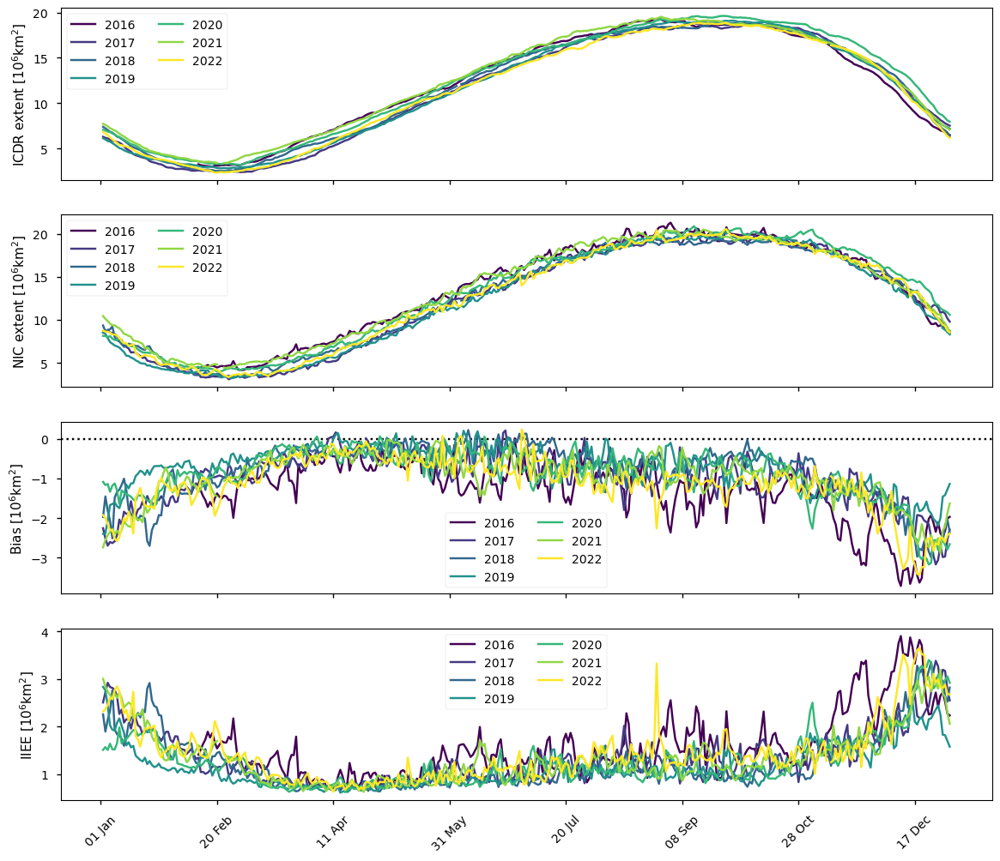

In [15]:
plot_time_series_doy(dataset_compare_nic.sel(region="southern_hemisphere"))

In the winter months, the areas where the ICDR and the NIC disagree are fairly uniformly spread around the continent. In the summer months, there are very large areas of disagreement in the Weddell, Bellingshausen and Ross Seas. In the Indian Ocean sector the areas of disagreement are biggest in summer but they are much less than in the Pacific and Atlantic sectors.

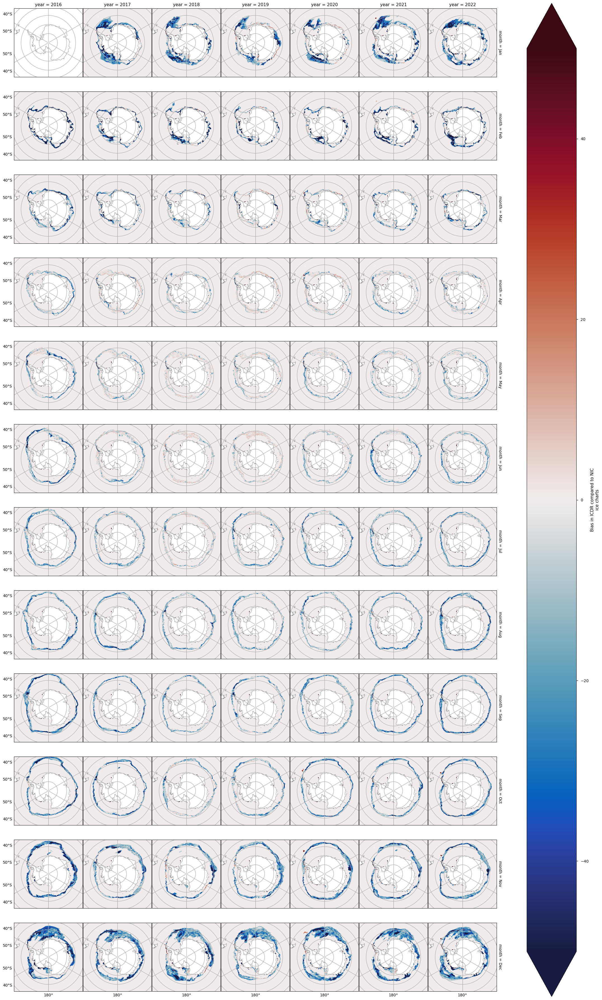

In [16]:
plot_bias_maps(datasets_maps, "southern_hemisphere")